<a href="https://colab.research.google.com/github/millerk22/model-change-paper/blob/main/ModelChangeDemo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
! git clone https://github.com/millerk22/model-change-paper.git


fatal: destination path 'model-change-paper' already exists and is not an empty directory.


In [3]:
!pip install mlflow

In [4]:
%cd model-change-paper/

/content/model-change-paper


In [5]:
import numpy as np 
import matplotlib.pyplot as plt
from util.graph_manager import GraphManager
from util.al_util import get_acc_multi
from util.activelearner import ActiveLearner
from util.gbssl import CrossEntropyGraphBasedSSLModelReduced, BinaryGraphBasedSSLModelReduced
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
import os
import copy

if not os.path.exists('tmp/'):
    os.makedirs('tmp/')

In [6]:
def create_checkerboard3_sep(N, delta=0.015):
    X = np.random.rand(N,2)
    labels = []
    for x in X:
        i, j = 0,0
        if 0.33333 <= x[0] and x[0] < 0.66666:
            i = 1
        elif 0.66666 <= x[0]:
            i = 2
            
        if 0.33333 <= x[1] and x[1] < 0.66666:
            j = 1
        elif 0.66666 <= x[1]:
            j = 2
        

        labels.append(3*j + i)
    labels = np.array(labels)
    X[labels == 0] += np.array([-delta,-delta])[np.newaxis,:]
    X[labels == 1] += np.array([0.,-delta])[np.newaxis,:]
    X[labels == 2] += np.array([delta,-delta])[np.newaxis,:]
    X[labels == 3] += np.array([-delta,0.])[np.newaxis,:]
    X[labels == 5] += np.array([delta,0.])[np.newaxis,:]
    X[labels == 6] += np.array([-delta,delta])[np.newaxis,:]
    X[labels == 7] += np.array([0.,delta])[np.newaxis,:]
    X[labels == 8] += np.array([delta,delta])[np.newaxis,:]


    labels[labels == 4] = 0
    labels[labels == 8] = 0
    labels[labels == 5] = 1
    labels[labels == 6] = 1
    labels[labels == 3] = 2
    labels[labels == 7] = 2
    return X, labels

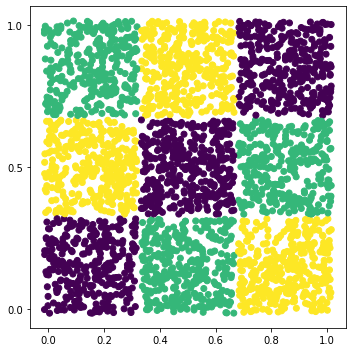

In [7]:
N = 3000
X, labels = create_checkerboard3_sep(N)
labels[labels == 0] = -1
plt.figure(figsize=(5,5))
plt.scatter(X[:,0], X[:,1], c=labels)
plt.yticks([0, 0.5, 1.0])
plt.tight_layout()
plt.show()

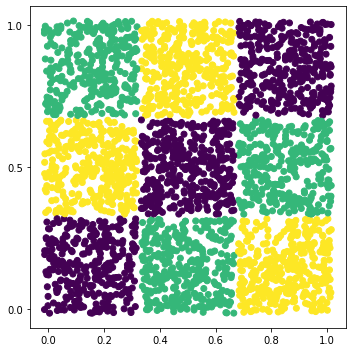

In [8]:
# calculate one-hot labels for oracle
enc = OneHotEncoder()
enc.fit(labels.reshape((-1, 1)))
oracle_onehot = enc.transform(labels.reshape((-1, 1))).todense()

### Ground Truth Plot
plt.figure(figsize=(5,5))
plt.scatter(X[:,0], X[:,1], c=labels)
plt.yticks([0, 0.5, 1.0])
plt.tight_layout()
#plt.title("Ground Truth")
plt.savefig("./c3-gt.png")
plt.show()

In [9]:
GRAPH_PARAMS = {
    'knn' :10,
    'n_eigs' : 50,
    'sigma' : 3.,
    'normalized' : True,
    'zp_k' : 5,
    'metric': 'euclidean'
}

gm = GraphManager()
evals, evecs = gm.from_features(X, knn=GRAPH_PARAMS['knn'], sigma=GRAPH_PARAMS['sigma'],
                        normalized=GRAPH_PARAMS['normalized'], n_eigs=GRAPH_PARAMS['n_eigs'],
                        zp_k=GRAPH_PARAMS['zp_k'], metric=GRAPH_PARAMS['metric']) # runs mlflow logging in this function call


Computing (or retrieving) graph evals and evecs with parameters:
	N = 3000, knn = 10, sigma = 3.0
	normalized = True, n_eigs = 50, zp_k = 5
	metric = euclidean

Did not find previous eigs, computing from scratch...
Calculating NN graph with SKLEARN NearestNeighbors...


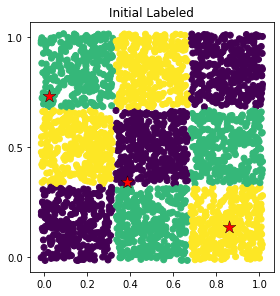

In [10]:
# Select initial labeled set
np.random.seed(42)
init_labeled, unlabeled = train_test_split(np.arange(N), train_size=3, stratify=labels)
init_labeled, unlabeled = list(init_labeled), list(unlabeled)

plt.figure(figsize=(4,4))
plt.scatter(X[:,0], X[:,1], c=labels)
plt.scatter(X[init_labeled,0], X[init_labeled,1], c='r', s=180, 
            marker='*', edgecolor='k', linewidths=0.4)
plt.yticks([0, 0.5, 1.0])
plt.tight_layout()
plt.title("Initial Labeled")
plt.show()

# Run Active Learning -- Model Change

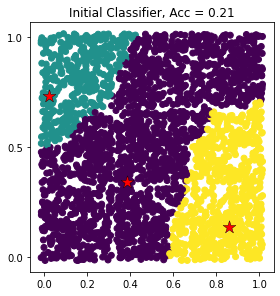

In [11]:
labeled = copy.deepcopy(init_labeled)
tau, gamma = 0.005, 0.8
num_al_iters, B = 100, 1
model_name = 'ce'

assert model_name in ['mgr', 'ce']

if model_name == 'mgr':
    model = BinaryGraphBasedSSLModelReduced('mgr', gamma, tau, w=evals, v=evecs)
else:
    model = CrossEntropyGraphBasedSSLModelReduced(gamma, tau, w=evals, v=evecs)


# train the initial model, record accuracy
model.calculate_model(labeled=init_labeled[:], y=oracle_onehot[init_labeled])
acc = get_acc_multi(np.argmax(model.m, axis=1),
                        labels, unlabeled=model.unlabeled)[1]


plt.figure(figsize=(4,4))
plt.scatter(X[:,0], X[:,1], c=np.argmax(model.m, axis=1))
plt.scatter(X[labeled,0], X[labeled,1], c='r', s=180, marker='*', edgecolor='k', linewidths=0.4)
plt.yticks([0, 0.5, 1.0])
plt.tight_layout()
plt.title("Initial Classifier, Acc = {:.2f}".format( acc))
plt.show()



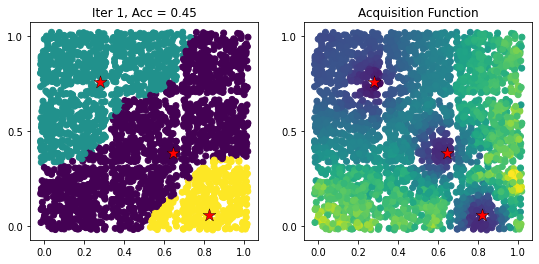

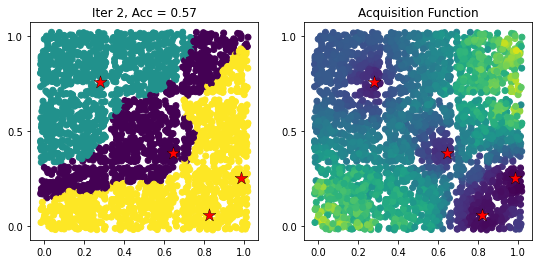

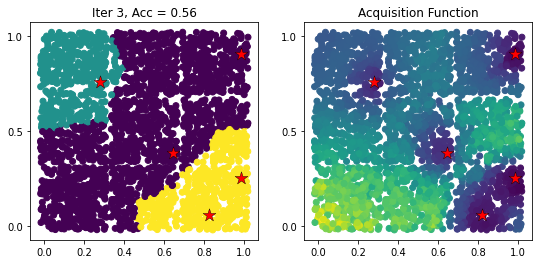

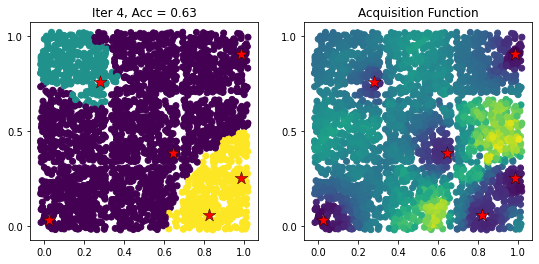

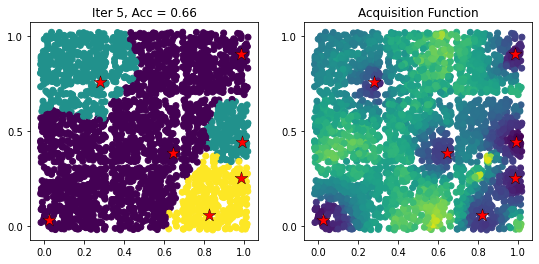

...

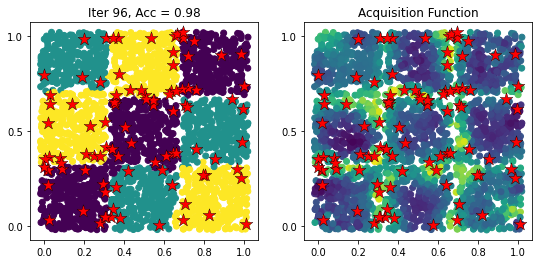

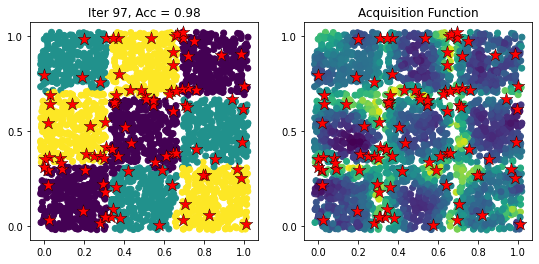

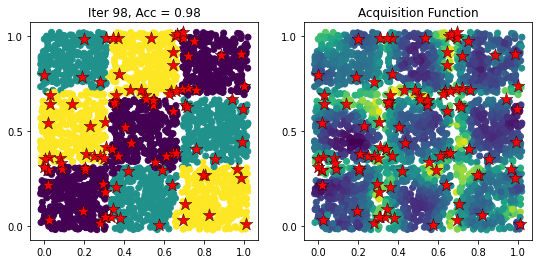

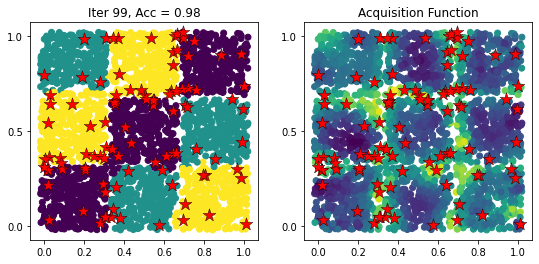

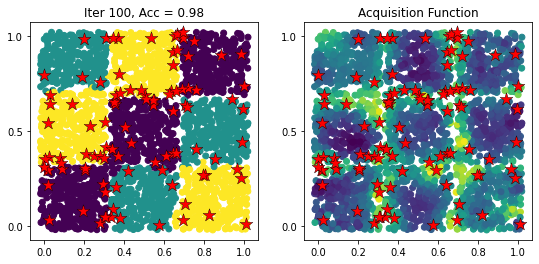

In [ ]:
# instantiate Active Learner
AL = ActiveLearner()

if not os.path.exists('./video/'):
    os.makedirs('./video/')


for it in range(num_al_iters):
    Q = AL.select_query_points(model, B=B)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9,4))
    ax1.scatter(X[:,0], X[:,1], c=np.argmax(model.m, axis=1))
    ax1.scatter(X[model.labeled,0], X[model.labeled,1], c='r', 
                s=180, marker='*', edgecolor='k', linewidths=0.4)
    ax1.set_yticks([0, 0.5, 1.0])
    ax1.set_yticks([0, 0.5, 1.0])
    ax2.scatter(X[model.unlabeled,0], X[model.unlabeled,1], c=AL.acq_vals)
    ax2.scatter(X[model.labeled,0], X[model.labeled,1], c='r', 
                s=180, marker='*', edgecolor='k', linewidths=0.4)
    ax2.set_yticks([0, 0.5, 1.0])
    ax2.set_yticks([0, 0.5, 1.0])


    # query oracle
    yQ = oracle_onehot[Q]

    # update model, and calculate updated model's accuracy
    model.update_model(Q, yQ)
    acc = get_acc_multi(np.argmax(model.m, axis=1),
                        labels, unlabeled=model.unlabeled)[1]

    ax1.set_title("Iter {}, Acc = {:.2f}".format(it+1, acc))
    ax2.set_title("Acquisition Function")
    plt.savefig('./video/c3-{:02d}.png'.format(it))
    plt.show()
    

In [ ]:
!zip -r ./video.zip ./video/

updating: video/ (stored 0%)
updating: video/c3-14.png (deflated 0%)
updating: video/c3-40.png (deflated 0%)
updating: video/c3-38.png (deflated 0%)
updating: video/c3-23.png (deflated 0%)
updating: video/c3-49.png (deflated 0%)
updating: video/c3-26.png (deflated 0%)
updating: video/c3-50.png (deflated 0%)
updating: video/c3-07.png (deflated 1%)
updating: video/c3-79.png (deflated 0%)
updating: video/c3-82.png (deflated 0%)
updating: video/c3-01.png (deflated 0%)
updating: video/c3-48.png (deflated 0%)
updating: video/c3-19.png (deflated 0%)
updating: video/c3-91.png (deflated 0%)
updating: video/c3-76.png (deflated 0%)
updating: video/c3-00.png (deflated 0%)
updating: video/c3-09.png (deflated 0%)
updating: video/c3-97.png (deflated 0%)
updating: video/c3-67.png (deflated 0%)
updating: video/c3-08.png (deflated 0%)
updating: video/c3-83.png (deflated 0%)
updating: video/c3-43.png (deflated 0%)
updating: video/c3-28.png (deflated 0%)
updating: video/c3-11.png (deflated 0%)
updating: v

In [ ]:
from google.colab import files
files.download("./video.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>